In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

DIV_CMAP = sns.diverging_palette(220, 0, as_cmap=True) # DIVERGENT COLOR MAP
sns.set_style("whitegrid")


METRICS_DIR = "../outputs/metrics/proxy_metrics_20220426"

## Compute correlations for individual metrics in DEV set

In [3]:
SPLIT = "dev"
DATASET = "all_datasets"
TARGET_COL = "human_correctness"

DEV_FILEPATH = f"{METRICS_DIR}/{SPLIT}_{DATASET}_metrics.csv.gz"

In [4]:
dev_df = pd.read_csv(DEV_FILEPATH, index_col=0)
print("Read dataset with", len(dev_df), "examples from", DEV_FILEPATH)
print("Data file contains data for:", dev_df.dataset.unique())
dev_df.describe()

Read dataset with 4009 examples from ../outputs/metrics/proxy_metrics_20220426/dev_all_datasets_metrics.csv.gz
Data file contains data for: ['cosmosqa' 'drop' 'mcscript' 'narrativeqa' 'quoref' 'socialiqa']


,human_correctness_original,human_correctness,exact_match,meteor,rouge1,rouge2,rougeL,rougeLsum,bleurt,bert-score,...,bleu-precision0,bleu-precision1,bleu-precision2,bleu-precision3,precision,recall,f1_score,csi,num_edits,edit_score
count,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,...,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000,4009.000000
mean,2.357238,0.339309,0.024944,0.247296,0.287694,0.107104,0.281029,0.281029,-0.688747,0.882008,...,0.258614,0.093471,0.042008,0.016961,0.258614,0.291364,0.245709,0.169090,4.633076,1.593062
std,1.498841,0.374710,1.579363,0.270958,0.274079,0.209965,0.270506,0.270506,0.762111,0.054886,...,0.291076,0.202191,0.145938,0.089283,0.291076,0.314313,0.258518,0.199534,4.168400,2.703827
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-2.616384,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.290687,0.847648,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.666667
50%,1.666667,0.166667,0.000000,0.161290,0.250000,0.000000,0.230769,0.230769,-0.831038,0.873768,...,0.166667,0.000000,0.000000,0.000000,0.166667,0.200000,0.181818,0.100000,3.000000,1.000000
75%,3.666667,0.666667,0.000000,0.387427,0.500000,0.111111,0.500000,0.500000,-0.151100,0.910523,...,0.500000,0.000000,0.000000,0.000000,0.500000,0.500000,0.444444,0.285714,6.000000,1.500000
max,5.000000,1.000000,100.000000,0.999624,1.000000,1.000000,1.000000,1.000000,1.200342,1.000011,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,79.000000,79.000000


In [5]:
# Define the columns to be all number types except the human correctness
METRIC_COLS = dev_df.select_dtypes("number").columns
features = list(METRIC_COLS[2:])

# Target column will be the normalized human correctness
target = METRIC_COLS[1]

### Correlations

In [25]:
def plot_correlations(data, col, corr_method="pearson", figsize=(16, 12), **kwargs):
    plt.figure(figsize=figsize)
    sns.heatmap(data.corr(method=corr_method), vmin=-1, vmax=1, cmap=DIV_CMAP, annot=True, fmt=".2", **kwargs)
    plt.show() 

    for val in data[col].unique():
        plt.figure(figsize=(16,12))
        df = data[data[col] == val]
        sns.heatmap(data.corr(method=corr_method), vmin=-1, vmax=1, cmap=DIV_CMAP, annot=True, fmt=".2", **kwargs)
        plt.title(f"{col}={val}")
        plt.show()

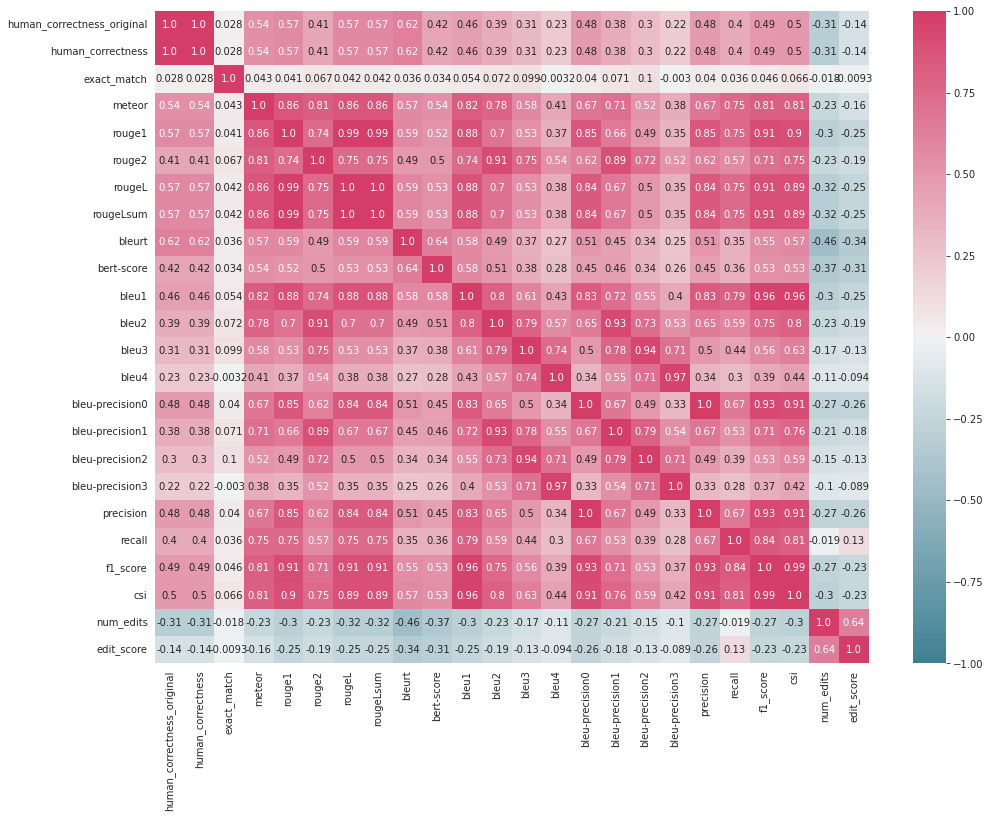

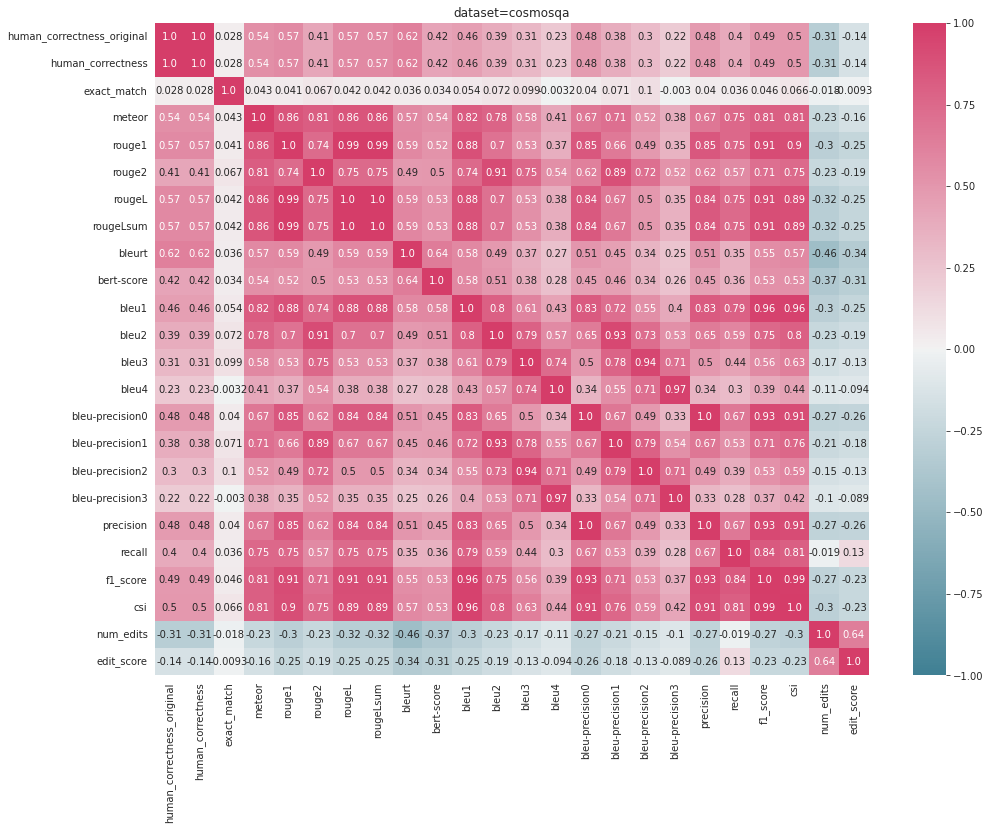

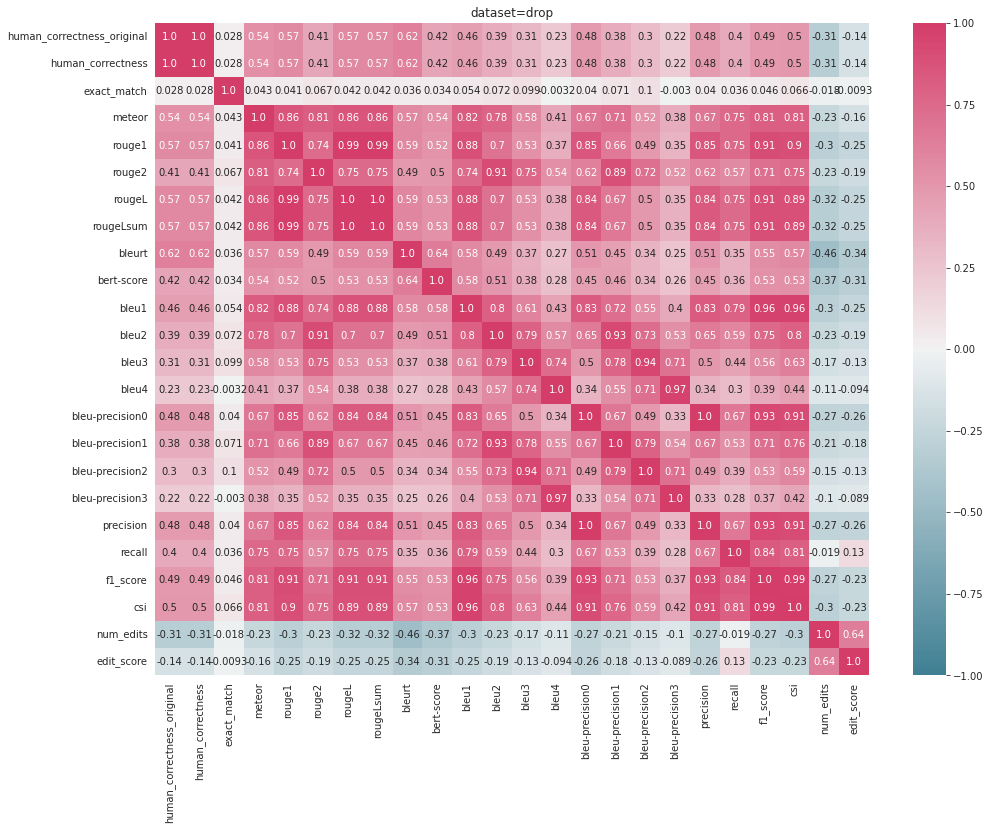

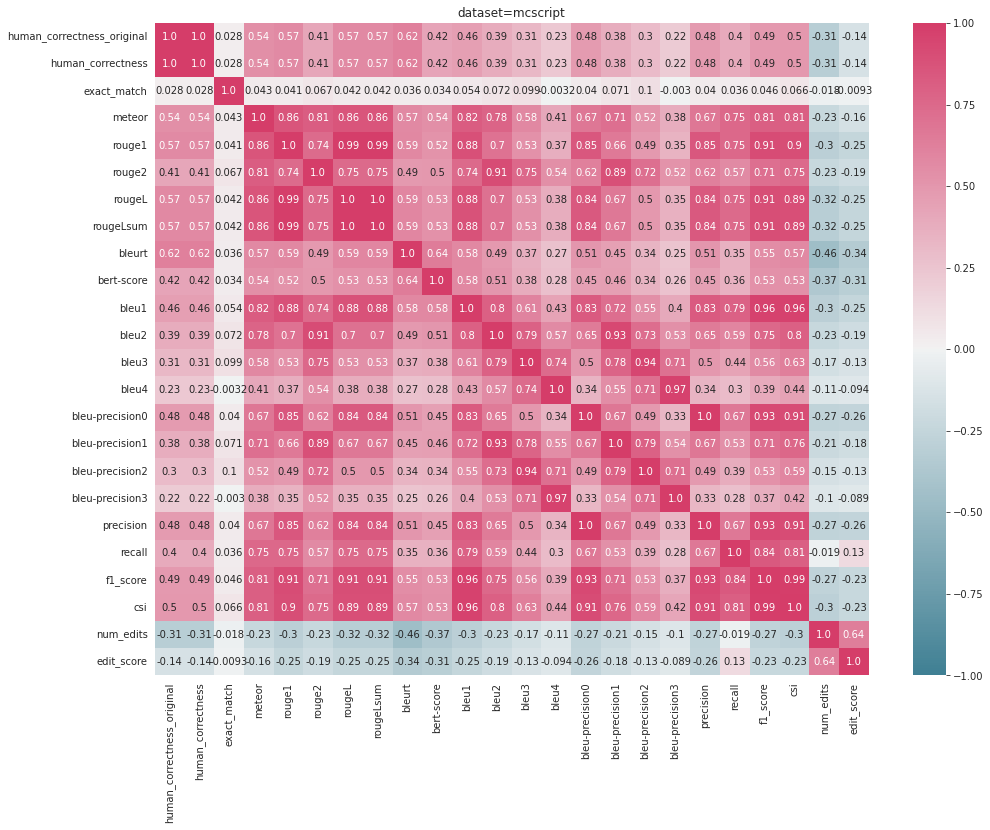

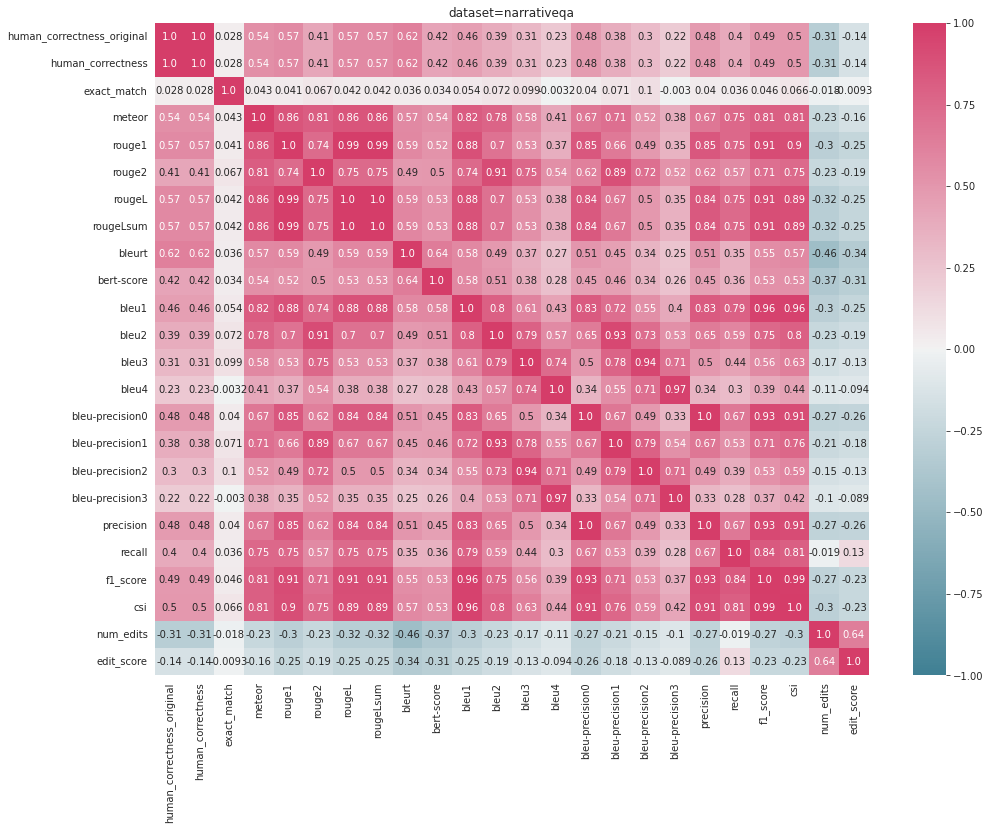

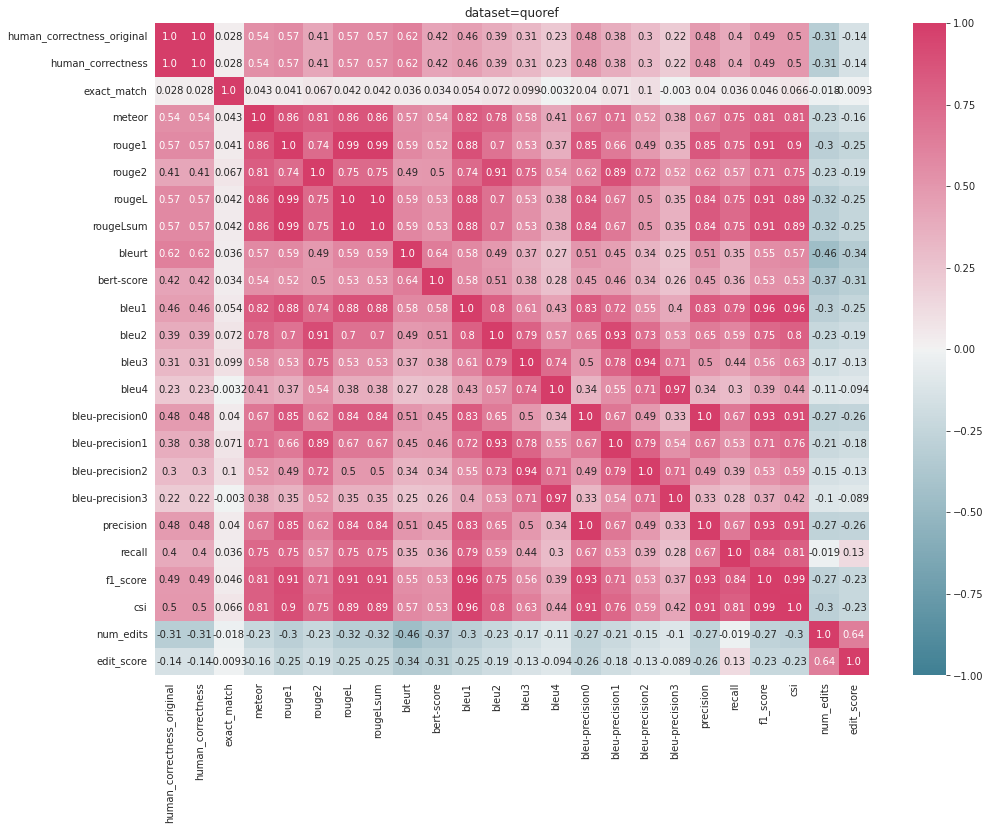

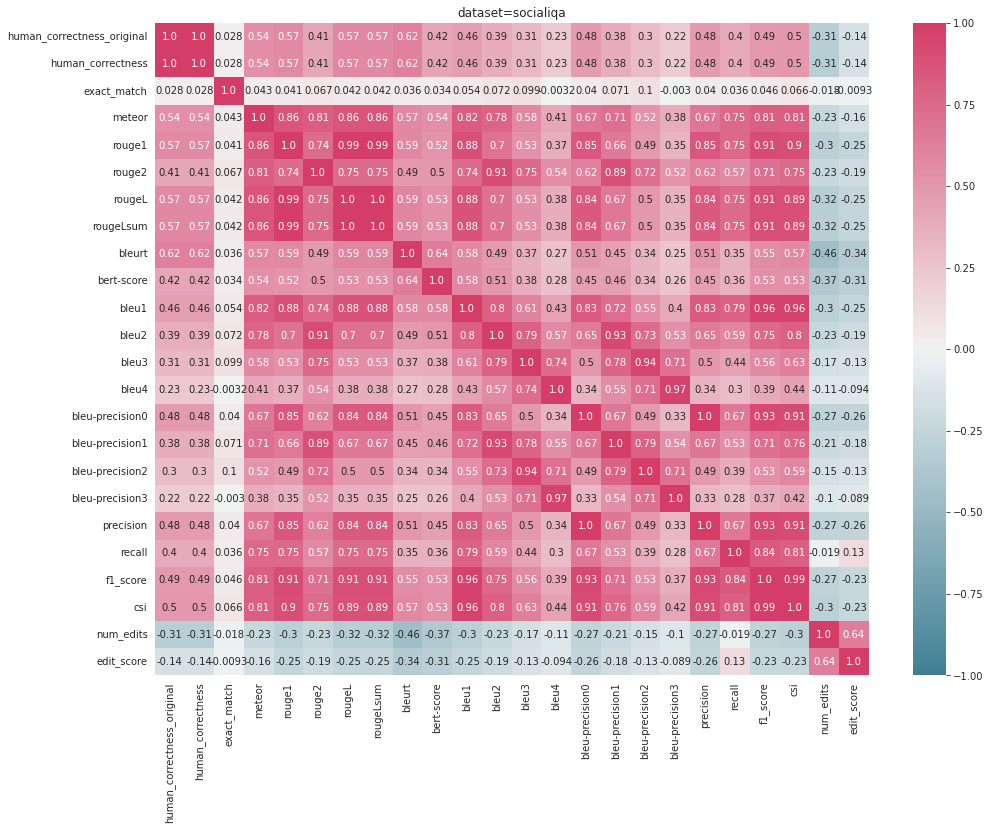

In [26]:
plot_correlations(dev_df, "dataset")

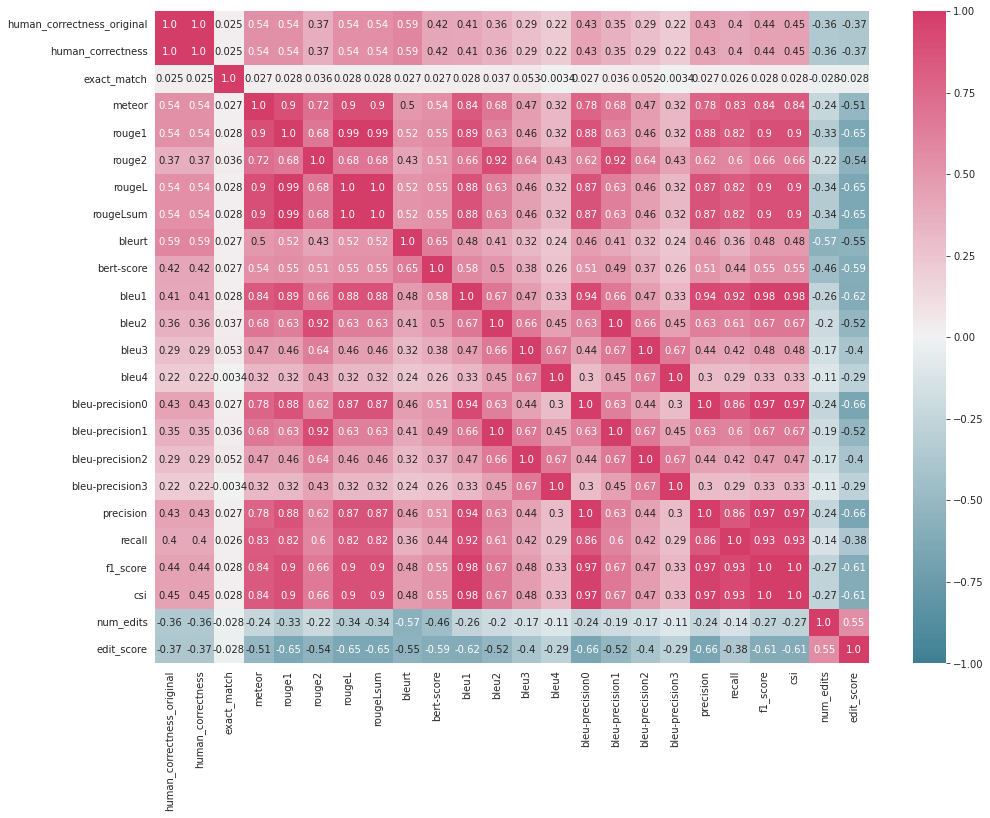

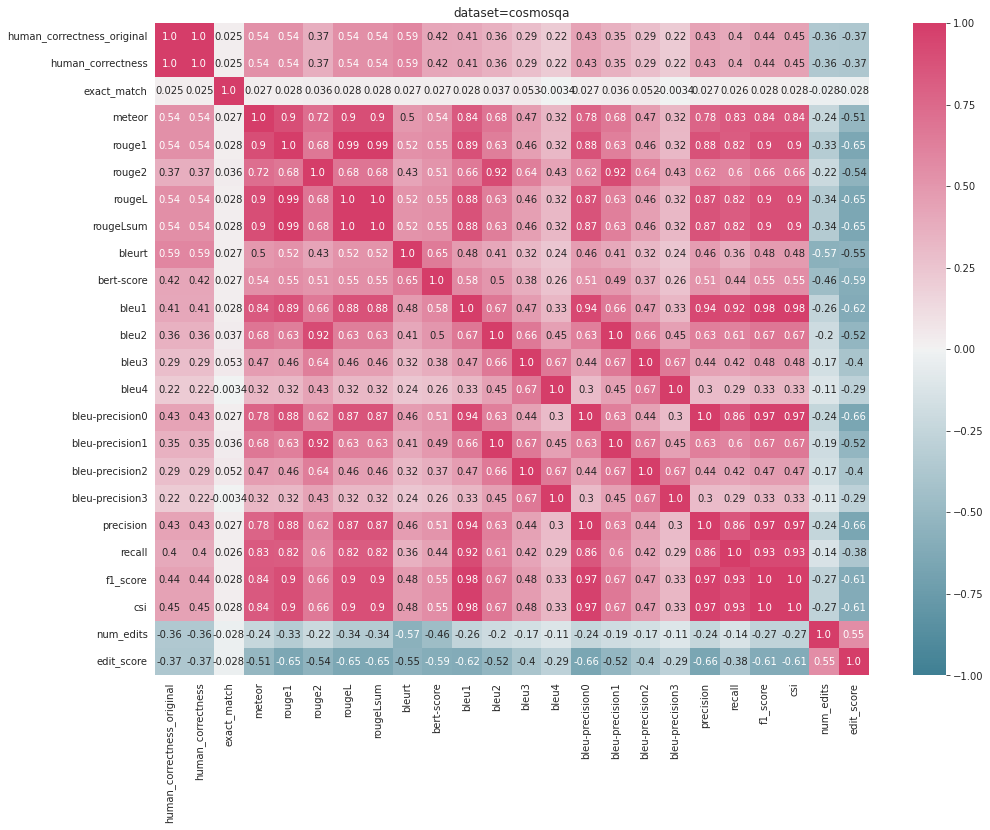

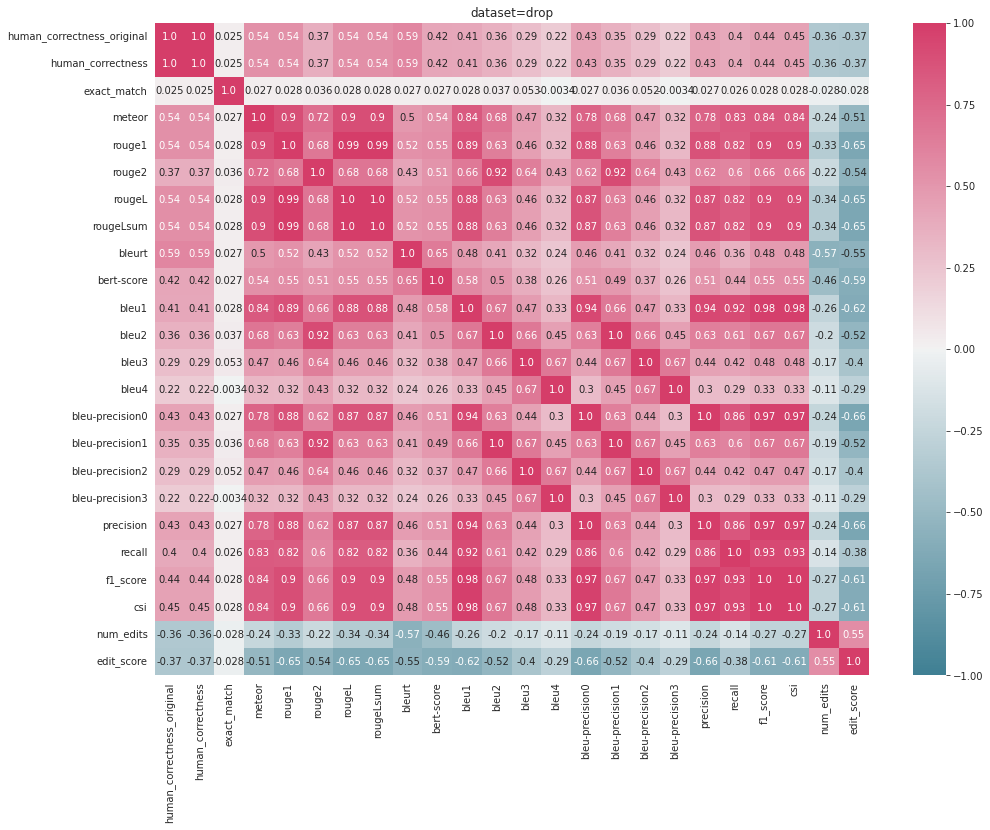

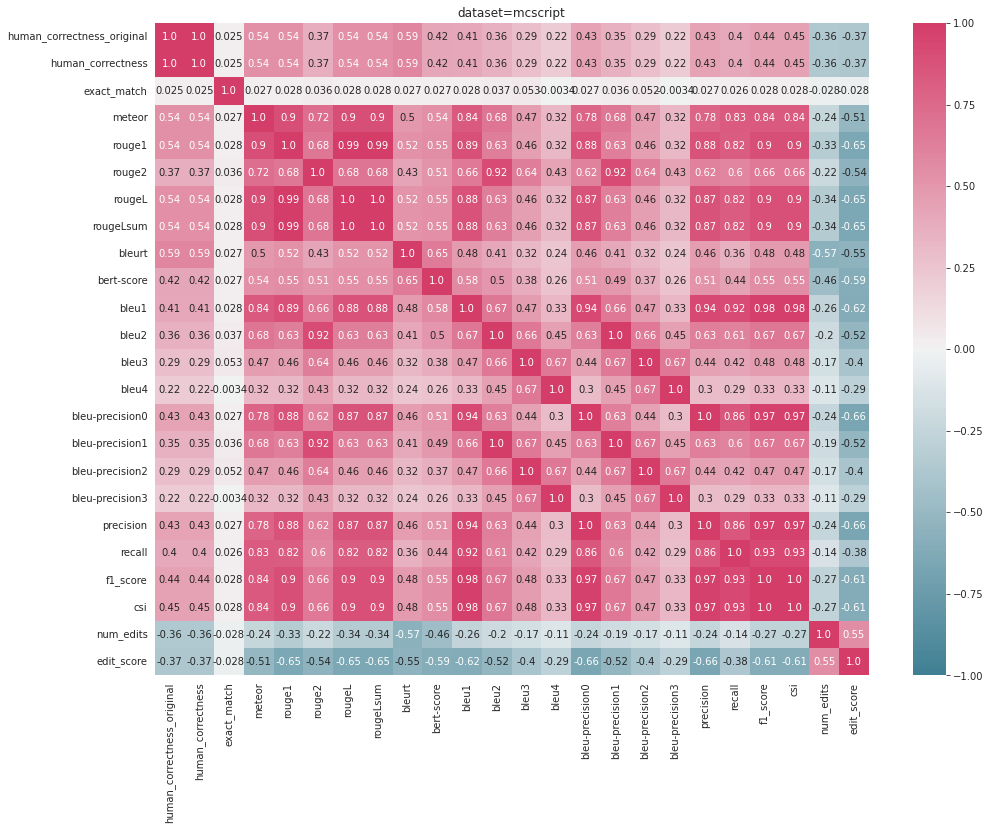

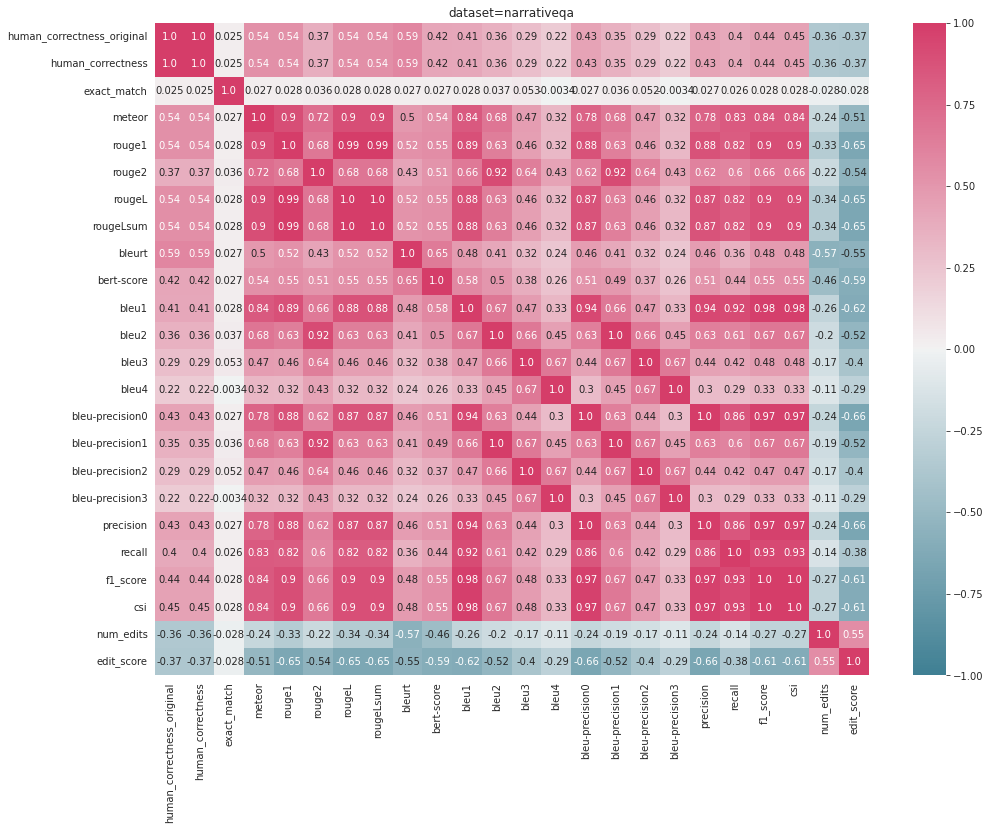

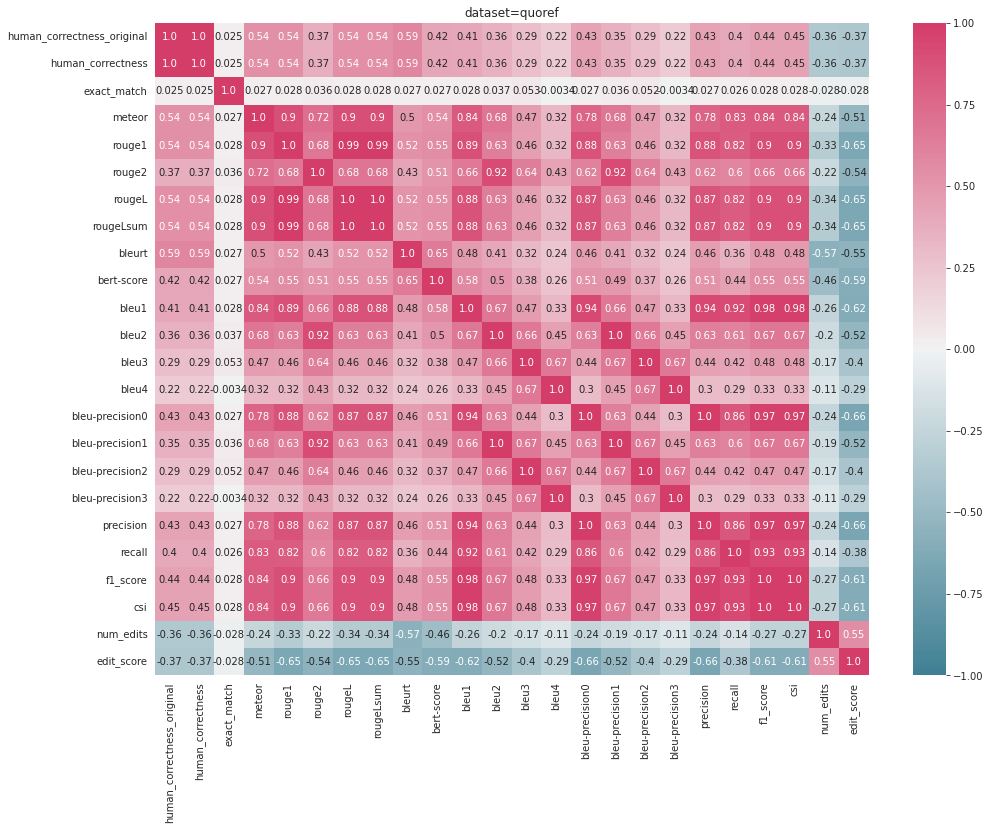

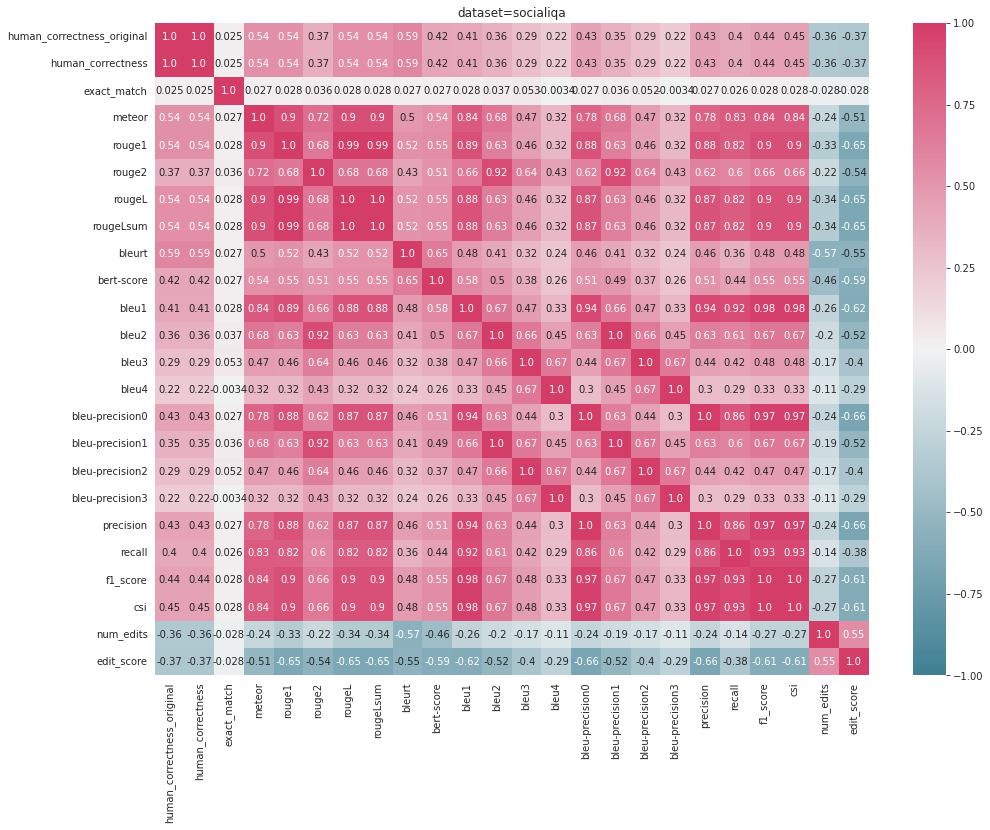

In [27]:
plot_correlations(dev_df, "dataset", corr_method="spearman")

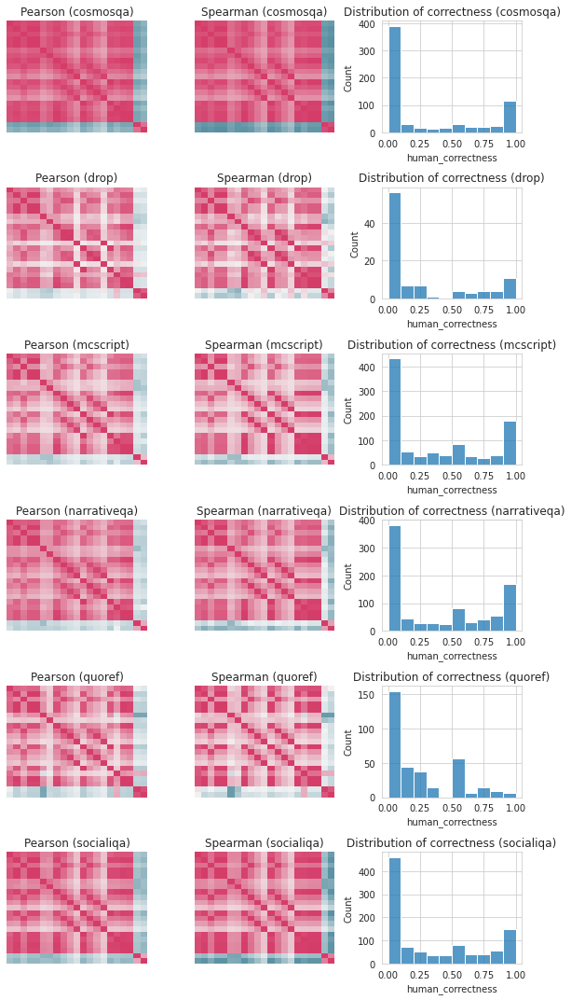

In [51]:
fig, axes = plt.subplots(nrows=dev_df.dataset.nunique(), ncols=3, figsize=(8, 15), tight_layout=True)

for i, dataset in enumerate(dev_df.dataset.unique()):
    ax_pearson, ax_spearman, ax_correctness = axes[i, 0], axes[i, 1], axes[i, 2]
    df = dev_df[dev_df["dataset"] == dataset]
    df_features = df[features[1:]]
    
    sns.heatmap(df_features.corr(method="pearson"), vmin=-1, vmax=1, cmap=DIV_CMAP, xticklabels=False, cbar=False, yticklabels=False,  ax=ax_pearson)
    ax_pearson.set_title(f"Pearson ({dataset})")
    
    sns.heatmap(df_features.corr(method="spearman"), vmin=-1, vmax=1, cmap=DIV_CMAP, xticklabels=False, cbar=False, yticklabels=False, ax=ax_spearman)
    ax_spearman.set_title(f"Spearman ({dataset})")
    
    ax_correctness.set_title(f"Distribution of correctness ({dataset})")
    sns.histplot(df, x="human_correctness", ax=ax_correctness, bins=10, binrange=(0,1))

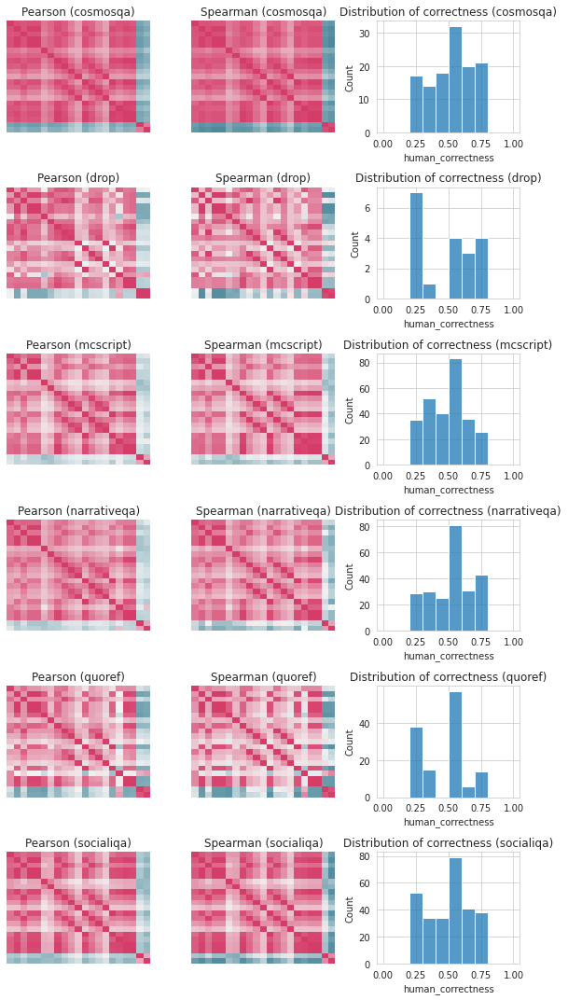

In [55]:
# How do these correlations change when we consider the subset of questions >= 2
fig, axes = plt.subplots(nrows=dev_df.dataset.nunique(), ncols=3, figsize=(8, 15), tight_layout=True)

data = dev_df[(dev_df["human_correctness"] >= 0.25) & (dev_df["human_correctness"] <= 0.75)]
for i, dataset in enumerate(data.dataset.unique()):
    ax_pearson, ax_spearman, ax_correctness = axes[i, 0], axes[i, 1], axes[i, 2]
    df = data[data["dataset"] == dataset]
    df_features = df[features[1:]]
    
    sns.heatmap(df_features.corr(method="pearson"), vmin=-1, vmax=1, cmap=DIV_CMAP, xticklabels=False, cbar=False, yticklabels=False,  ax=ax_pearson)
    ax_pearson.set_title(f"Pearson ({dataset})")
    
    sns.heatmap(df_features.corr(method="spearman"), vmin=-1, vmax=1, cmap=DIV_CMAP, xticklabels=False, cbar=False, yticklabels=False, ax=ax_spearman)
    ax_spearman.set_title(f"Spearman ({dataset})")
    
    ax_correctness.set_title(f"Distribution of correctness ({dataset})")
    sns.histplot(df, x="human_correctness", ax=ax_correctness, bins=10, binrange=(0,1))

### Determine the metrics distribution

<AxesSubplot:xlabel='meteor', ylabel='human_correctness'>

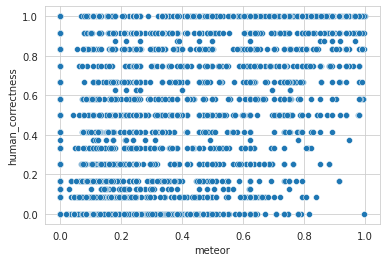

In [7]:
sns.scatterplot(data=dev_df, x="meteor", y="human_correctness")

<AxesSubplot:xlabel='recall', ylabel='f1_score'>

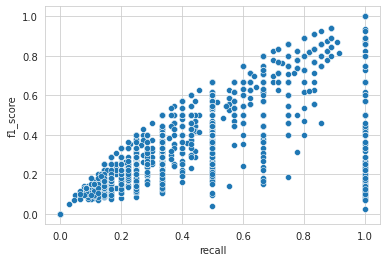

In [56]:
sns.scatterplot(data=dev_df, x="recall", y="f1_score")

<AxesSubplot:xlabel='bert-score', ylabel='human_correctness'>

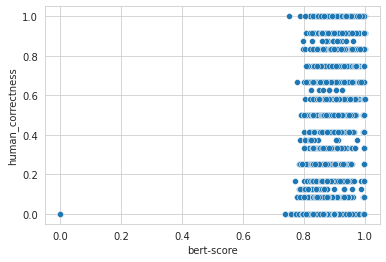

In [9]:
sns.scatterplot(data=dev_df, x="bert-score", y="human_correctness")

In [10]:
dev_df[dev_df["bert-score"] <= 0.6]

,example_id,reference,candidate,reference_tokens,candidate_tokens,human_correctness_original,human_correctness,exact_match,meteor,rouge1,...,bleu-precision2,bleu-precision3,precision,recall,f1_score,csi,num_edits,edit_score,dataset,split
1781,03b295909a3f74c31b436246ea201898,Europe,NaN,['Europe'],[],1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,narrativeqa,dev
2769,68180404887589a9d3ac1ff44c8ac99a,"George Attla, Jr",NaN,"['George', 'Attla', ',', 'Jr']",[],1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,quoref,dev


<AxesSubplot:xlabel='recall', ylabel='f1_score'>

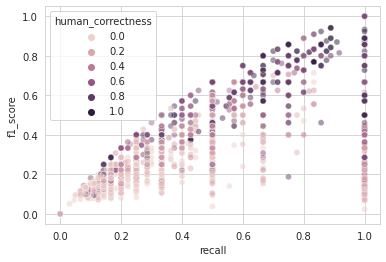

In [60]:
sns.scatterplot(data=dev_df, x="recall", y="f1_score", hue="human_correctness", alpha=0.5)

<AxesSubplot:xlabel='recall', ylabel='bleu1'>

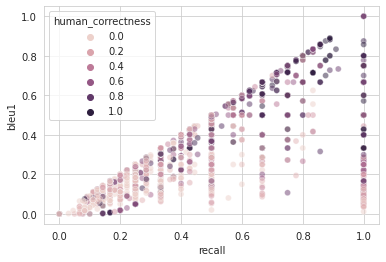

In [68]:
sns.scatterplot(data=dev_df, x="recall", y="bleu1", hue="human_correctness", alpha=0.5)

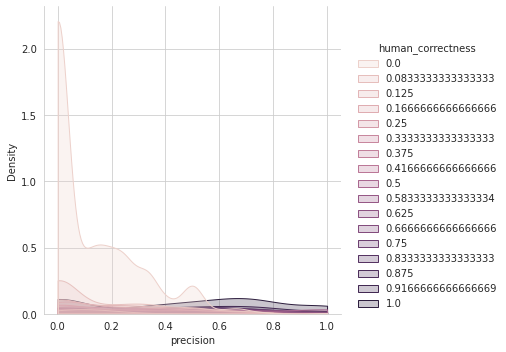

In [22]:
sns.displot(data=dev_df, x="precision", hue="human_correctness", kind="kde", fill=True, cut=0)

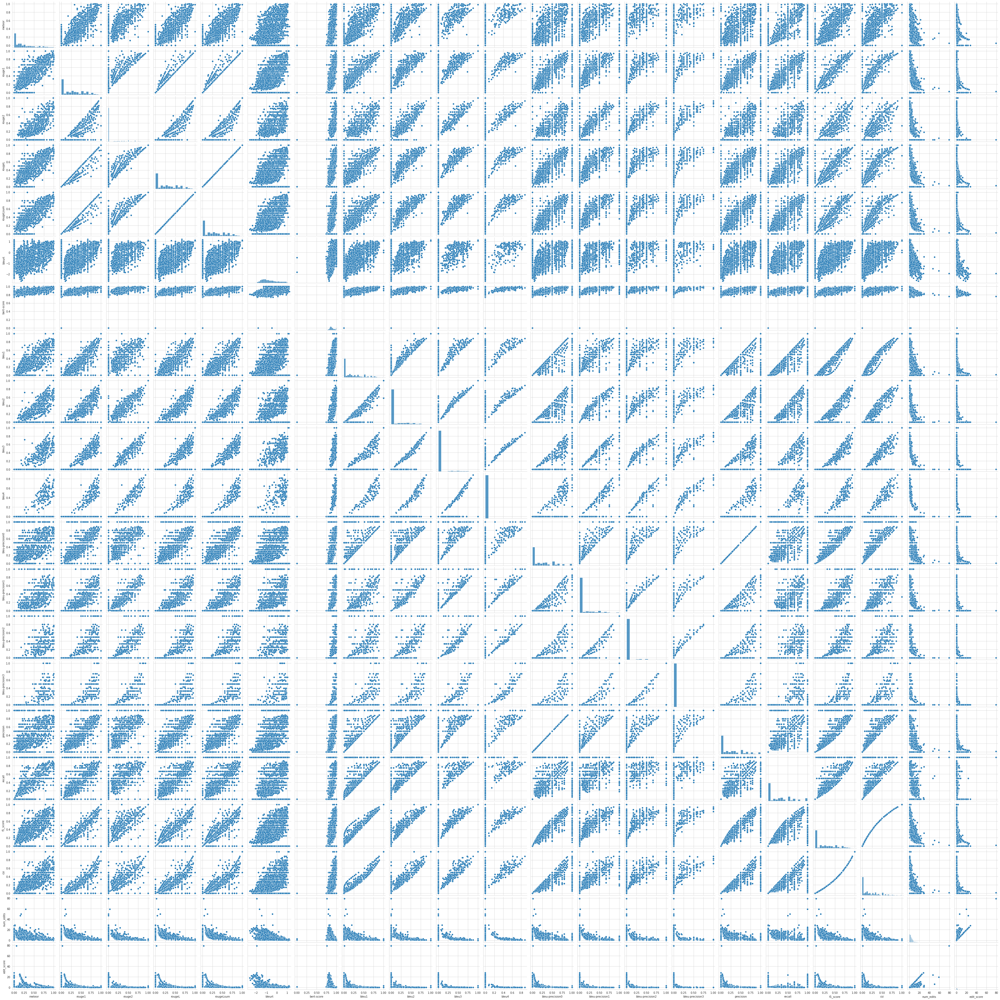

In [72]:
sns.pairplot(dev_df[features[1:]])

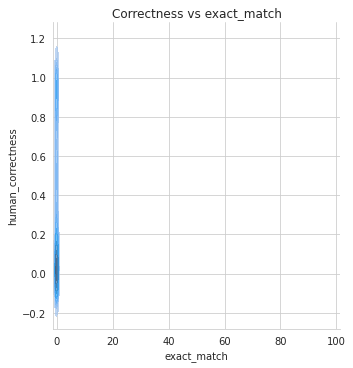

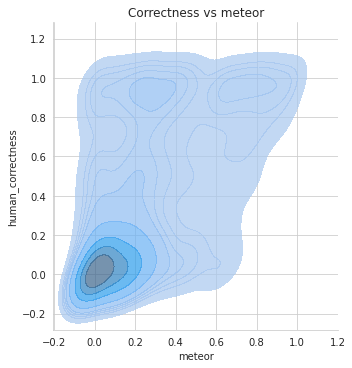

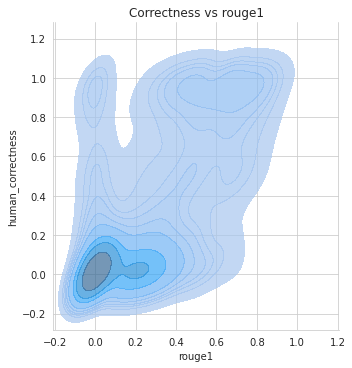

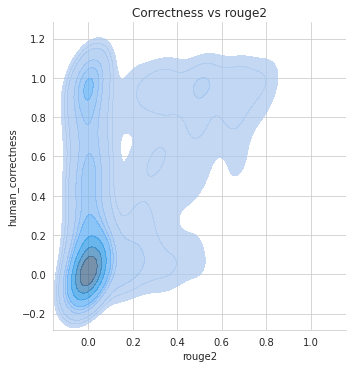

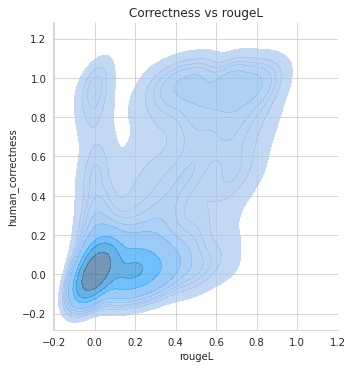

...

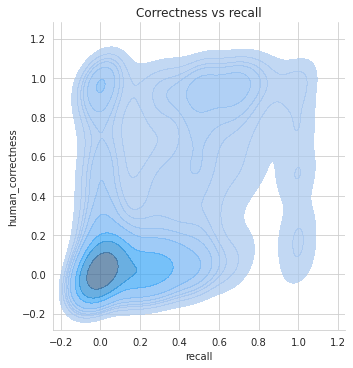

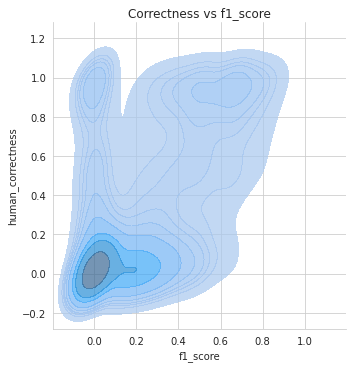

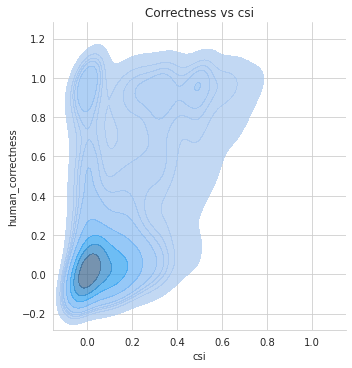

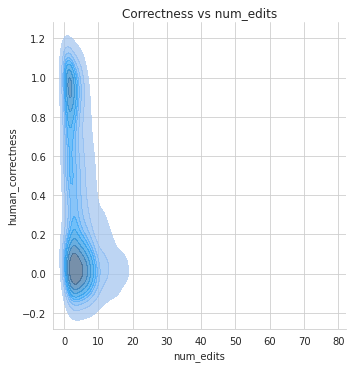

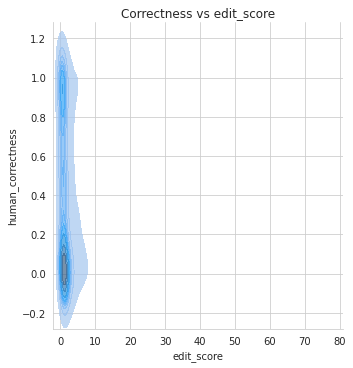

In [23]:
for feat in features:
    sns.displot(data=dev_df, x=feat, y="human_correctness", kind="kde", fill=True, alpha=0.7)
    plt.title(f"Correctness vs {feat}")
    plt.show()

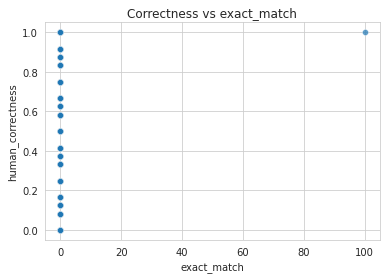

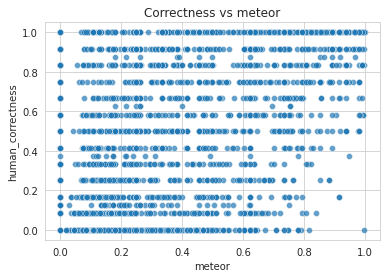

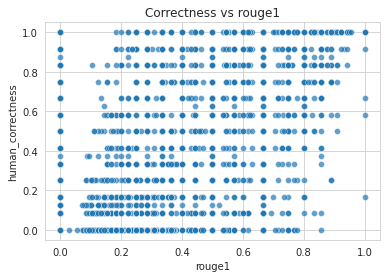

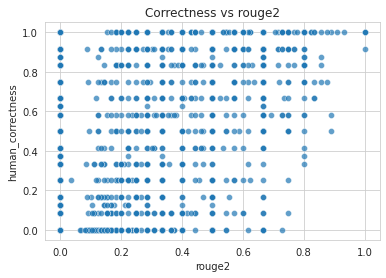

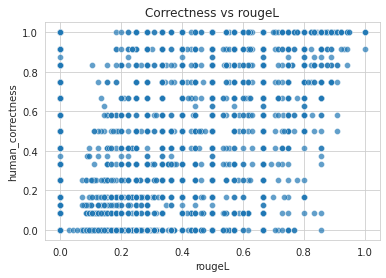

...

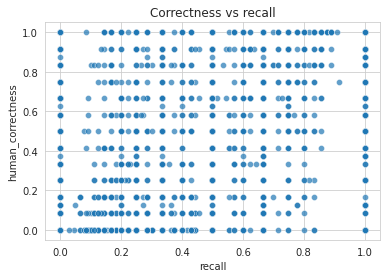

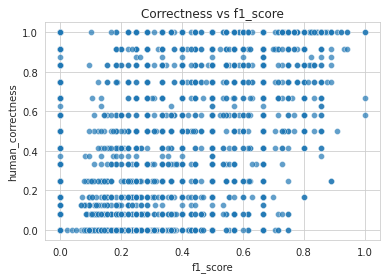

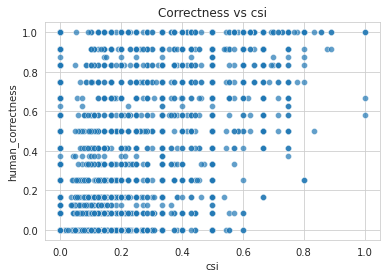

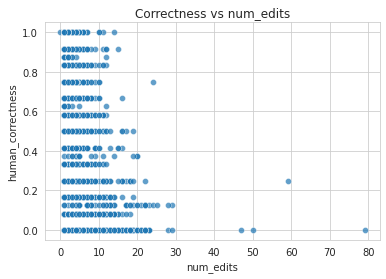

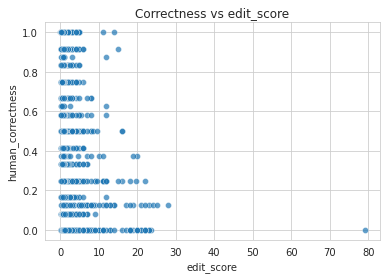

In [15]:
for feat in features:
    sns.scatterplot(data=dev_df, x=feat, y="human_correctness", alpha=0.7)
    plt.title(f"Correctness vs {feat}")
    plt.show()

### Compute Pearson and Spearman Correlations

In [74]:
def collect_correlations(df, dataset=None, metric_cols=None, target_col=TARGET_COL):
    from scipy.stats import pearsonr, spearmanr
    from sklearn.metrics import mean_absolute_error, mean_squared_error

    if dataset is not None:
        df = df[df["dataset"] == dataset].copy()
    
    if metric_cols is None:
        metric_cols = df.select_dtypes("number").columns
    
    results = {}
    for metric_col in metric_cols:
        metric_corrs = {}
        
        correctness = df[target_col]
        metric_values = df[metric_col]
        
        metric_corrs["mae"] = mean_absolute_error(y_true=correctness, y_pred=metric_values)
        metric_corrs["mse"] = mean_squared_error(y_true=correctness, y_pred=metric_values)

        pearson_val, p_value = pearsonr(correctness, metric_values)
        metric_corrs["pearson"] = pearson_val
        metric_corrs["pearson_pval"] = p_value

        spearman_val, p_value = spearmanr(correctness, metric_values)
        metric_corrs["spearman"] = spearman_val
        metric_corrs["spearman_pval"] = p_value
        
        metric_corrs["n"] = len(df)
        results[metric_col] = metric_corrs
        
    return results


def get_all_correlations(df):
    unique_datasets = sorted(df.dataset.unique())

    correlations = {"all_datasets": collect_correlations(df)}
    correlations.update({
        d: collect_correlations(df, dataset=d) for d in unique_datasets
    })
    
    return correlations


# Sanity check (:
collect_correlations(dev_df)
get_all_correlations(dev_df)

/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/home/kat/miniconda3

{'all_datasets': {'human_correctness_original': {'mae': 2.017928411075081,
   'mse': 5.335389903966076,
   'pearson': 1.0,
   'pearson_pval': 0.0,
   'spearman': 1.0,
   'spearman_pval': 0.0,
   'n': 4009},
  'human_correctness': {'mae': 0.0,
   'mse': 0.0,
   'pearson': 1.0,
   'pearson_pval': 0.0,
   'spearman': 1.0,
   'spearman_pval': 0.0,
   'n': 4009},
  'exact_match': {'mae': 0.36375446911116655,
   'mse': 2.7000035510379425,
   'pearson': 0.02785433581031986,
   'pearson_pval': 0.07782701870676718,
   'spearman': 0.025262548882053704,
   'spearman_pval': 0.10975468251793481,
   'n': 4009},
  'meteor': {'mae': 0.23061045893632676,
   'mse': 0.11195072668688463,
   'pearson': 0.543264174610528,
   'pearson_pval': 1.1074087214518502e-306,
   'spearman': 0.5361934868693253,
   'spearman_pval': 2.637414521688378e-297,
   'n': 4009},
  'rouge1': {'mae': 0.22745892917055074,
   'mse': 0.10207389101174523,
   'pearson': 0.5652010583275225,
   'pearson_pval': 0.0,
   'spearman': 0.53875

In [75]:
dev_correlations = get_all_correlations(dev_df)

dev_corr_dfs = []
for dataset_name, correlations in dev_correlations.items():
    _df = pd.DataFrame.from_dict(correlations).T 
    dev_corr_dfs.append(_df)

dev_corr_dfs = pd.concat(dev_corr_dfs, keys=list(dev_correlations.keys()), axis=1)
dev_corr_dfs.to_csv(f"{METRICS_DIR}/dev_individual_correlations.csv")
dev_corr_dfs

/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/kat/miniconda3/envs/eqqa-env/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/home/kat/miniconda3

all_datasets                                      \
                                    mae        mse   pearson   pearson_pval   
human_correctness_original     2.017928   5.335390  1.000000   0.000000e+00   
human_correctness              0.000000   0.000000  1.000000   0.000000e+00   
exact_match                    0.363754   2.700004  0.027854   7.782702e-02   
meteor                         0.230610   0.111951  0.543264  1.107409e-306   
rouge1                         0.227459   0.102074  0.565201   0.000000e+00   
rouge2                         0.271477   0.173116  0.414784  1.614887e-166   
rougeL                         0.225403   0.101313  0.570436   0.000000e+00   
rougeLsum                      0.225403   0.101313  0.570436   0.000000e+00   
bleurt                         1.046647   1.421937  0.623474   0.000000e+00   
bert-score                     0.562113   0.420528  0.422590  2.008415e-173   
bleu1                          0.252278   0.133461  0.458211  2.411723e-207   
bleu2                          0.277897   0.180750  0.389773  1.346872e-145   
bleu3                          0.303339   0.213310  0.313138   6.404673e-92   
bleu4                          0.320925   0.234198  0.230285   2.112790e-49   
bleu-precision0                0.247908   0.127219  0.478575  1.244443e-228   
bleu-precision1                0.280831   0.184300  0.378778  5.862619e-137   
bleu-precision2                0.307582   0.217469  0.298000   5.099725e-83   
bleu-precision3                0.324624   0.237816  0.215788   1.881055e-43   
precision                      0.247908   0.127219  0.478575  1.244443e-228   
recall                         0.272672   0.147939  0.397042  1.712677e-151   
f1_score                       0.243340   0.121566  0.487287  3.459094e-238   
csi                            0.249984   0.134470  0.499551  4.048896e-252   
num_edits                      4.294265  36.929466 -0.314251   1.353341e-92   
edit_score                     1.408879   9.308958 -0.142085   1.574646e-19   

                                                             cosmosqa  \
                            spearman  spearman_pval       n       mae   
human_correctness_original  1.000000   0.000000e+00  4009.0  1.908492   
human_correctness           1.000000   0.000000e+00  4009.0  0.000000   
exact_match                 0.025263   1.097547e-01  4009.0  0.302831   
meteor                      0.536193  2.637415e-297  4009.0  0.205919   
rouge1                      0.538756  1.119329e-300  4009.0  0.220872   
rouge2                      0.374631  8.730745e-134  4009.0  0.197295   
rougeL                      0.540206  1.342110e-302  4009.0  0.214199   
rougeLsum                   0.540206  1.342110e-302  4009.0  0.214199   
bleurt                      0.591277   0.000000e+00  4009.0  0.829732   
bert-score                  0.415687  2.622901e-167  4009.0  0.607418   
bleu1                       0.408451  4.743625e-161  4009.0  0.223536   
bleu2                       0.356140  3.416841e-120  4009.0  0.206654   
bleu3                       0.288984   5.749807e-78  4009.0  0.231842   
bleu4                       0.215705   2.029389e-43  4009.0  0.252486   
bleu-precision0             0.430928  5.290887e-181  4009.0  0.225497   
bleu-precision1             0.354963  2.340009e-119  4009.0  0.210015   
bleu-precision2             0.288403   1.199383e-77  4009.0  0.238901   
bleu-precision3             0.215438   2.588760e-43  4009.0  0.262392   
precision                   0.430928  5.290887e-181  4009.0  0.225497   
recall                      0.399797  9.113108e-154  4009.0  0.249478   
f1_score                    0.444884  3.549311e-194  4009.0  0.229992   
csi                         0.445161  1.914057e-194  4009.0  0.221474   
num_edits                  -0.364977  1.411694e-126  4009.0  5.764519   
edit_score                 -0.374333  1.469588e-133  4009.0  1.003236   

                                                 ...    quoref           